# HackUPC: HP Inventory Forecasting

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from scipy.stats import boxcox
from statsmodels.api import qqplot

%matplotlib inline
warnings.filterwarnings("ignore")
plt.style.use("fivethirtyeight")
rand_val = 765

In [2]:
path = 'data/'

In [3]:
df = pd.read_csv(f'{path}train.csv')

In [4]:
df.head()

,id,date,year_week,product_number,reporterhq_id,prod_category,specs,display_size,segment,sales_units,inventory_units
0,202119-6909,2021-05-15,202119,6909,93,Arale,21274,13.3,Premium,2.0,35.0
1,202120-6909,2021-05-22,202120,6909,93,Arale,21274,13.3,Premium,0.0,70.0
2,202121-6909,2021-05-29,202121,6909,93,Arale,21274,13.3,Premium,3.0,137.0
3,202122-6909,2021-06-05,202122,6909,93,Arale,21274,13.3,Premium,0.0,274.0
4,202123-6909,2021-06-12,202123,6909,93,Arale,21274,13.3,Premium,0.0,333.0


In [5]:
df.shape

(15454, 11)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15454 entries, 0 to 15453
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               15454 non-null  object 
 1   date             15454 non-null  object 
 2   year_week        15454 non-null  int64  
 3   product_number   15454 non-null  int64  
 4   reporterhq_id    15454 non-null  int64  
 5   prod_category    15454 non-null  object 
 6   specs            15454 non-null  int64  
 7   display_size     15454 non-null  float64
 8   segment          15454 non-null  object 
 9   sales_units      14963 non-null  float64
 10  inventory_units  14961 non-null  float64
dtypes: float64(3), int64(4), object(4)
memory usage: 1.3+ MB


In [7]:
df.loc[(pd.isna(df.sales_units)) | (pd.isna(df.inventory_units))].sort_values(by = ['year_week']).head(25)

,id,date,year_week,product_number,reporterhq_id,prod_category,specs,display_size,segment,sales_units,inventory_units
13482,201919-233919,2019-05-11,201919,233919,3,Clover,106370,15.6,Core,10.0,NaN
13487,201921-233919,2019-05-25,201921,233919,24,Clover,106370,15.6,Core,NaN,214.0
13498,201927-233919,2019-07-06,201927,233919,3,Clover,106370,15.6,Core,91.0,NaN
13521,201938-233919,2019-09-21,201938,233919,24,Clover,106370,15.6,Core,NaN,57.0
13520,201938-233919,2019-09-21,201938,233919,3,Clover,106370,15.6,Core,NaN,63.0
13552,202002-233919,2020-01-11,202002,233919,3,Clover,106370,15.6,Core,NaN,25.0
13564,202008-233919,2020-02-22,202008,233919,3,Clover,106370,15.6,Core,36.0,NaN
14145,202016-235893,2020-04-18,202016,235893,24,Clover,50284,17.3,Core,1.0,NaN
13584,202018-233919,2020-05-02,202018,233919,3,Clover,106370,15.6,Core,NaN,1.0
14160,202031-235893,2020-08-01,202031,235893,24,Clover,50284,17.3,Core,8.0,NaN


In [8]:
df.loc[(pd.isna(df.sales_units)) & (pd.isna(df.inventory_units))].sort_values(by = ['year_week']).head(25)

,id,date,year_week,product_number,reporterhq_id,prod_category,specs,display_size,segment,sales_units,inventory_units
1468,202124-24675,2021-06-19,202124,24675,24,Conan,4835,13.3,Premium,NaN,NaN
10645,202208-187530,2022-02-26,202208,187530,78,Bobobo,142149,16.1,Gaming,NaN,NaN
12859,202225-221088,2022-06-25,202225,221088,78,Doraemon,37713,16.1,Gaming,NaN,NaN
3533,202236-51324,2022-09-10,202236,51324,21,Goku,168258,15.6,Core,NaN,NaN
4341,202244-64155,2022-11-05,202244,64155,12,Clover,121842,14.0,Core,NaN,NaN
3569,202249-51324,2022-12-10,202249,51324,15,Goku,168258,15.6,Core,NaN,NaN
9534,202313-167790,2023-04-01,202313,167790,24,Goku,58987,17.3,Gaming,NaN,NaN
2030,202317-30597,2023-04-29,202317,30597,3,Clover,195334,15.6,Core,NaN,NaN


In [9]:
df = df.loc[~(pd.isna(df.sales_units)) | ~(pd.isna(df.inventory_units))].sort_values(by = ['year_week'])

- We have about 976 nulls from sales_units and inventory_units
- 8 cases where both are null, and 968 where only one of them are null
- Wont drop for now, as we might be able to interpolate

In [10]:
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')

In [11]:
df['week'] = df['year_week'].astype('str').str[-2:]
df['year'] = df['year_week'].astype('str').str[:-2]

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15446 entries, 13476 to 15453
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               15446 non-null  object        
 1   date             15446 non-null  datetime64[ns]
 2   year_week        15446 non-null  int64         
 3   product_number   15446 non-null  int64         
 4   reporterhq_id    15446 non-null  int64         
 5   prod_category    15446 non-null  object        
 6   specs            15446 non-null  int64         
 7   display_size     15446 non-null  float64       
 8   segment          15446 non-null  object        
 9   sales_units      14963 non-null  float64       
 10  inventory_units  14961 non-null  float64       
 11  week             15446 non-null  object        
 12  year             15446 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(4), object(5)
memory usage: 1.6+ MB


In [13]:
df.describe()

,year_week,product_number,reporterhq_id,specs,display_size,sales_units,inventory_units
count,15446.000000,15446.000000,15446.000000,15446.000000,15446.000000,14963.000000,14961.000000
mean,202240.709828,127208.491130,42.146057,112262.589732,15.163395,25.974938,71.726222
std,61.598909,77502.438142,34.912978,63618.986014,1.422477,29.392055,66.145326
min,201915.000000,6909.000000,3.000000,967.000000,11.000000,0.000000,0.000000
25%,202218.000000,58233.000000,15.000000,58987.000000,14.000000,3.000000,26.000000
50%,202239.000000,116466.000000,24.000000,109271.000000,15.600000,16.000000,56.000000
75%,202304.000000,196413.000000,78.000000,157621.000000,15.600000,38.000000,97.000000
max,202318.000000,247737.000000,96.000000,236915.000000,17.300000,186.000000,399.000000


In [14]:
print(f'\nTotal number of unique products: {len(df.product_number.unique())}')
print(f'\nTotal number of unique product categories: {len(df.prod_category.unique())}')
print(f'\nTotal number of unique segments: {len(df.segment.unique())}')
print(f'\nTotal number of unique weeks: {len(df.week.unique())}')
print(f'\nTotal number of unique years: {len(df.year.unique())}')


Total number of unique products: 100

Total number of unique product categories: 7

Total number of unique segments: 3

Total number of unique weeks: 53

Total number of unique years: 5


In [15]:
prod_freq = df.groupby(['product_number'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'count', ascending = False)

prod_freq.product_number = prod_freq.product_number.astype('str')

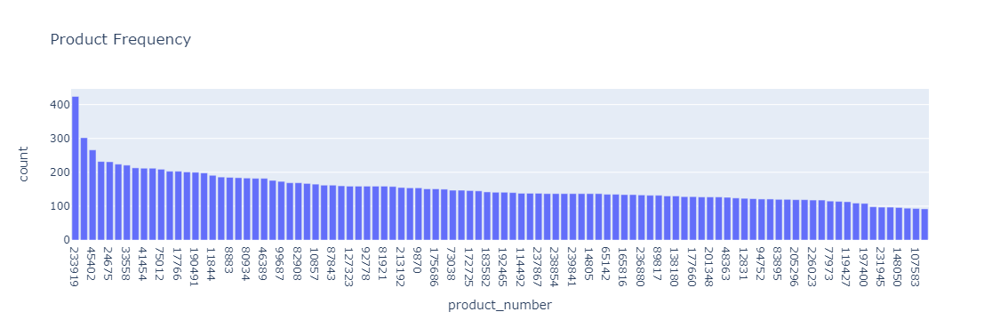

In [16]:
fig = px.bar(
    prod_freq, 
    x = 'product_number', 
    y = 'count',
    title = 'Product Frequency'
)

fig.show()

In [17]:
prod_cat_freq = df.groupby(['prod_category'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'count', ascending = False)

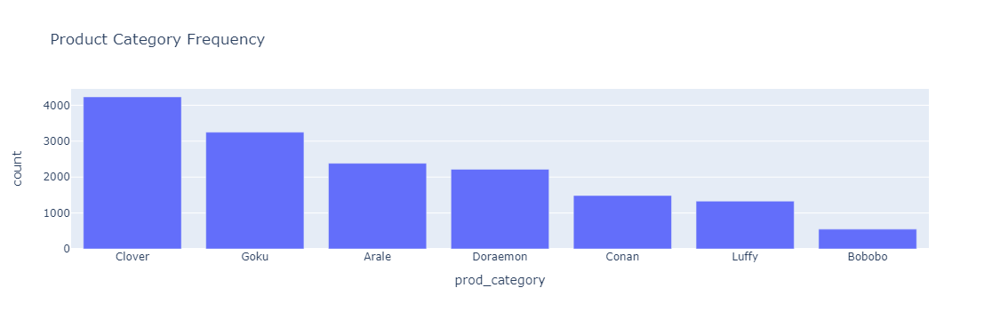

In [18]:
fig = px.bar(
    prod_cat_freq, 
    x = 'prod_category', 
    y = 'count',
    title = 'Product Category Frequency'
)

fig.show()

In [19]:
segment_freq = df.groupby(['segment'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'count', ascending = False)

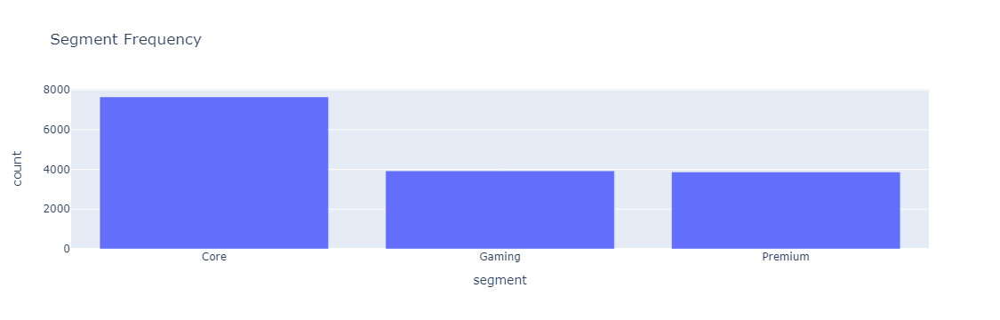

In [20]:
fig = px.bar(
    segment_freq, 
    x = 'segment', 
    y = 'count',
    title = 'Segment Frequency'
)

fig.show()

In [21]:
venders_per_product = df[['product_number', 'reporterhq_id']].drop_duplicates().groupby(['product_number'])['reporterhq_id'].count(
).reset_index().rename(columns = {'reporterhq_id': 'count'}).sort_values(by = 'count', ascending = False)

venders_per_product.product_number = venders_per_product.product_number.astype('str')

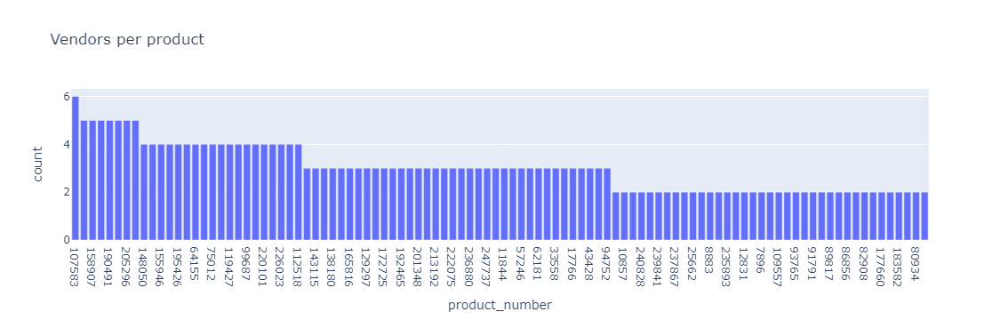

In [22]:
fig = px.bar(
    venders_per_product, 
    x = 'product_number', 
    y = 'count',
    title = 'Vendors per product'
)

fig.show()

In [23]:
week = df.groupby(['week'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'week', ascending = True)

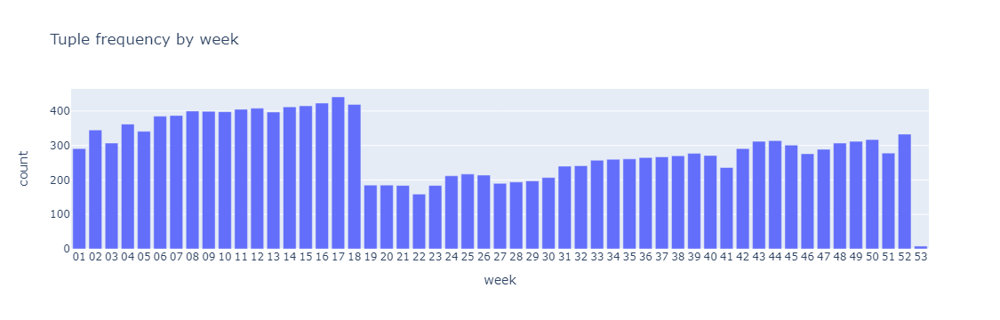

In [24]:
fig = px.bar(
    week, 
    x = 'week', 
    y = 'count',
    title = 'Tuple frequency by week'
)

fig.show()

In [25]:
year = df.groupby(['year'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'year', ascending = True)

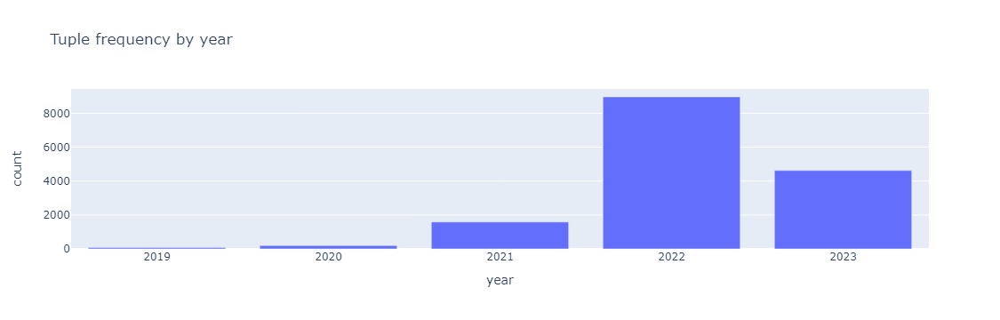

In [26]:
fig = px.bar(
    year, 
    x = 'year', 
    y = 'count',
    title = 'Tuple frequency by year'
)

fig.show()

In [27]:
year_ex_vendors = df[['id', 'date', 'product_number', 'year']].drop_duplicates().groupby(['year'])['id'].count().reset_index().rename(columns = {'id': 'count'}).sort_values(by = 'year', ascending = True)

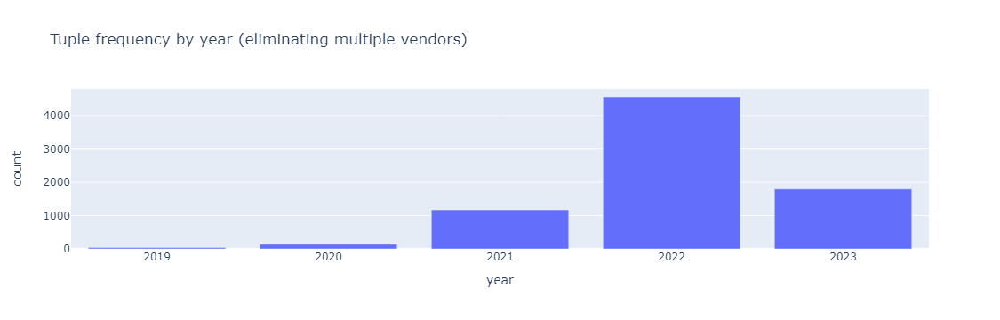

In [28]:
fig = px.bar(
    year_ex_vendors, 
    x = 'year', 
    y = 'count',
    title = 'Tuple frequency by year (eliminating multiple vendors)'
)

fig.show()

In [29]:
df.year = df.year.astype('int32')
df = df.loc[df.year >= 2021]

In [30]:
df2 = df.copy()

# do laplace addition to deal with 0 inventory unit cases
df2['sales_inv_ratio'] = (df2['sales_units'] + 1) / (df2['inventory_units'] + 1)
df2 = df2[['date', 'product_number', 'reporterhq_id', 'sales_inv_ratio']]

In [31]:
df2_agg = df2[['product_number', 'reporterhq_id', 'sales_inv_ratio']].groupby(['product_number', 'reporterhq_id'])['sales_inv_ratio'].count(
).reset_index().rename(columns = {'sales_inv_ratio': 'count'}).sort_values(
    by = ['product_number', 'count'], ascending = False
)

In [32]:
df2_agg['vendor'] = df2_agg.sort_values(['product_number','count'], ascending = [True,False]).groupby(['product_number']).cumcount() + 1

In [33]:
df2a = df2.merge(
    df2_agg,
    how = 'inner',
    left_on = ['product_number', 'reporterhq_id'],
    right_on = ['product_number', 'reporterhq_id']
)

df2a = df2a[['date', 'product_number', 'vendor', 'sales_inv_ratio']]

In [34]:
df2_pivot = pd.pivot_table(df2a, index = ['date', 'product_number'], columns = 'vendor', fill_value = np.nan, values = 'sales_inv_ratio'
).reset_index().reset_index(drop = True)

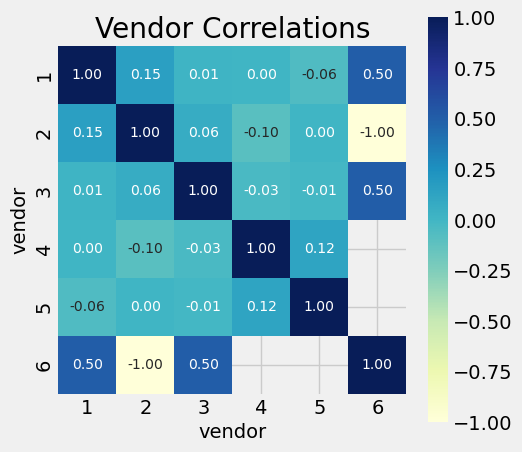

In [35]:
df2_pivot_corr = df2_pivot[[1, 2, 3, 4, 5, 6]].corr(method = 'spearman')
plt.figure(figsize = (5, 5))
sns.heatmap(df2_pivot_corr, annot = True, annot_kws = {'size': 10}, square = True, cmap = 'YlGnBu', fmt = '.2f').set(title = 'Vendor Correlations')
plt.show()

In [36]:
df2_pivot_b = df2_pivot[['product_number', 1, 2]].dropna()

In [37]:
product_list = df2_pivot_b.product_number.unique().tolist()
corr_list = []

for product in product_list:
    corr_list.append(df2_pivot_b.loc[df2_pivot_b.product_number == product].corr()[1][2])
    
# nan
del corr_list[-32]

In [38]:
sum(corr_list) / len(corr_list)

0.045288962345584494

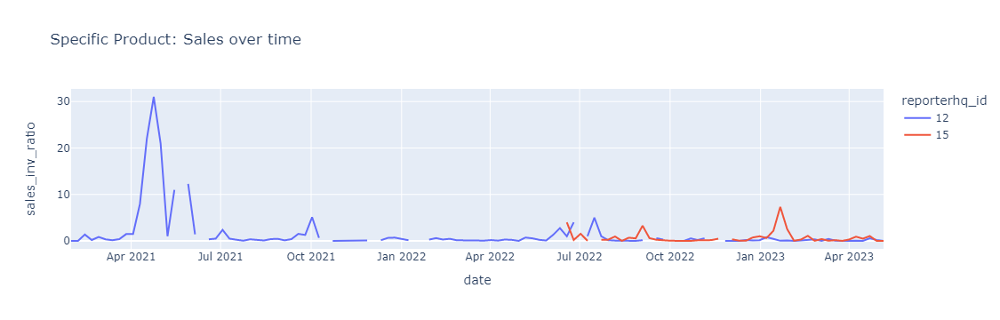

In [39]:
fig = px.line(
    df2.loc[df.product_number == 10857], 
    x = 'date', 
    y = 'sales_inv_ratio',
    color = 'reporterhq_id',
    title = 'Specific Product: Sales over time'
)

fig.show()

In [40]:
# fig = px.line(
#     df.loc[df.segment == 'Core'], 
#     x = 'date', 
#     y = 'sales_units',
#     color = 'reporterhq_id',
#     title = 'Specific Product: Sales over time'
# )

# fig.show()

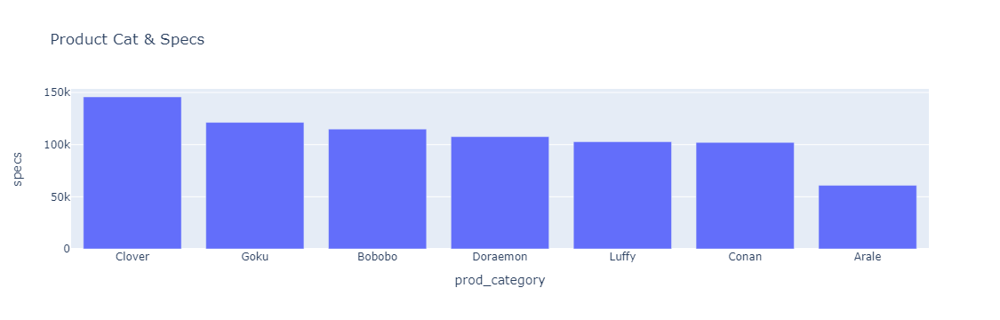

In [41]:
fig = px.bar(
    df.groupby(['prod_category'])['specs'].mean().reset_index().sort_values(by = 'specs', ascending = False), 
    x = 'prod_category', 
    y = 'specs',
    title = 'Product Cat & Specs'
)

fig.show()

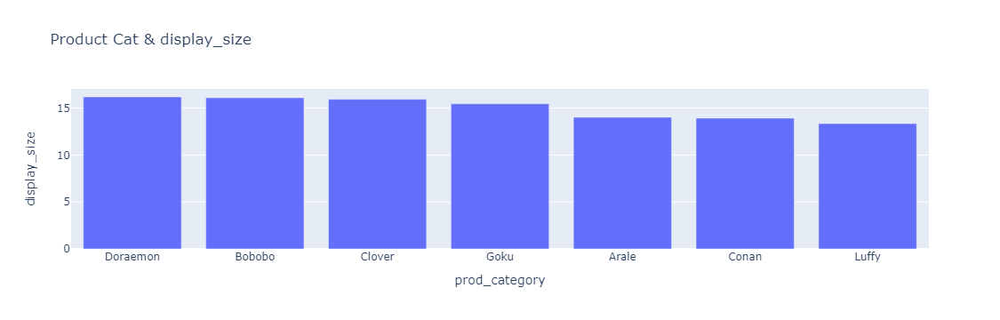

In [42]:
fig = px.bar(
    df.groupby(['prod_category'])['display_size'].mean().reset_index().sort_values(by = 'display_size', ascending = False), 
    x = 'prod_category', 
    y = 'display_size',
    title = 'Product Cat & display_size'
)

fig.show()

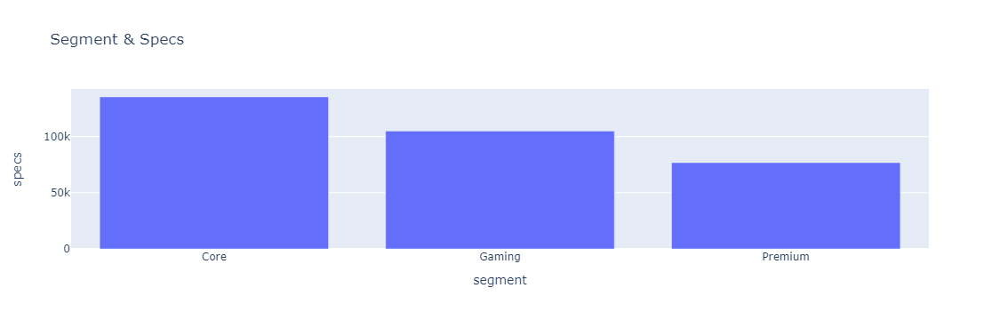

In [43]:
fig = px.bar(
    df.groupby(['segment'])['specs'].mean().reset_index().sort_values(by = 'specs', ascending = False), 
    x = 'segment', 
    y = 'specs',
    title = 'Segment & Specs'
)

fig.show()

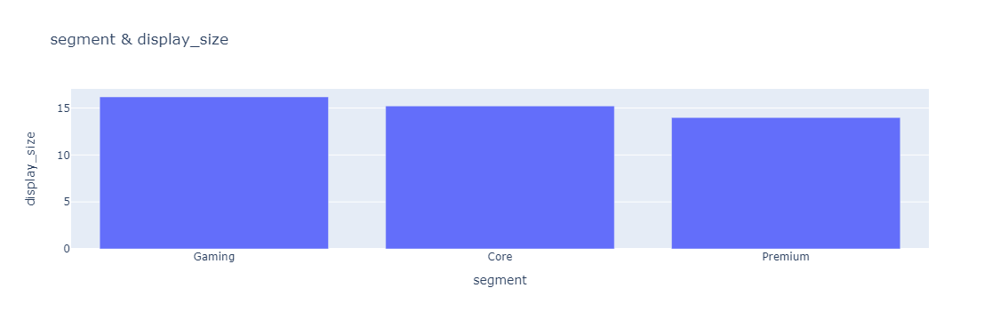

In [44]:
fig = px.bar(
    df.groupby(['segment'])['display_size'].mean().reset_index().sort_values(by = 'display_size', ascending = False), 
    x = 'segment', 
    y = 'display_size',
    title = 'segment & display_size'
)

fig.show()

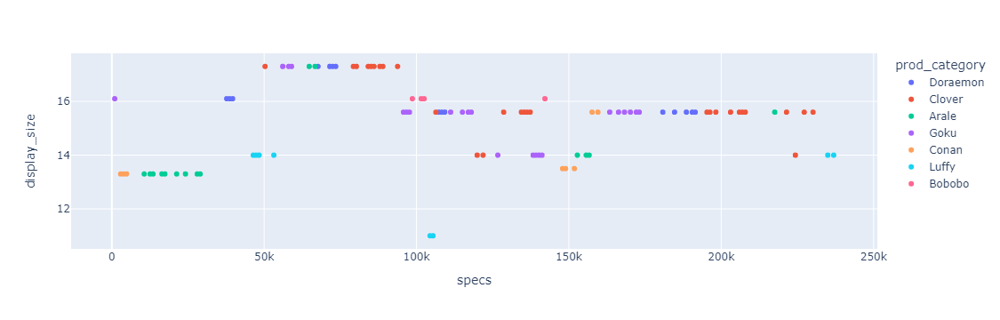

In [45]:
fig = px.scatter(
    df, 
    x = 'specs', 
    y = 'display_size',
    color = 'prod_category',
    title = ''
)

fig.show()

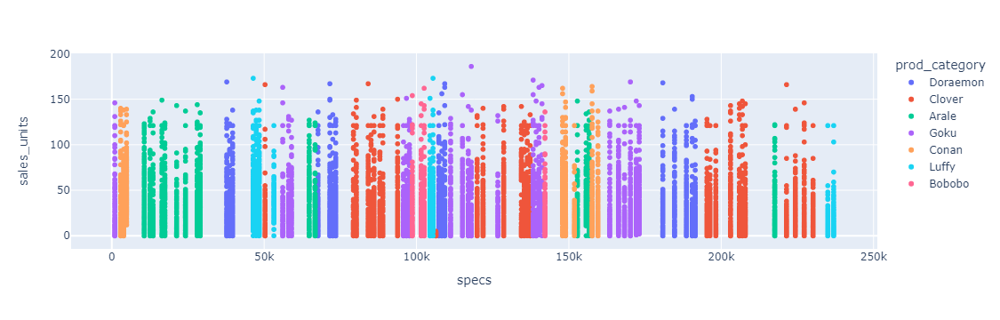

In [46]:
fig = px.scatter(
    df, 
    x = 'specs', 
    y = 'sales_units',
    color = 'prod_category',
    title = ''
)

fig.show()

In [47]:
sales_inv = df.groupby(['product_number', 'prod_category', 'segment'])['sales_units', 'inventory_units'].median().reset_index()

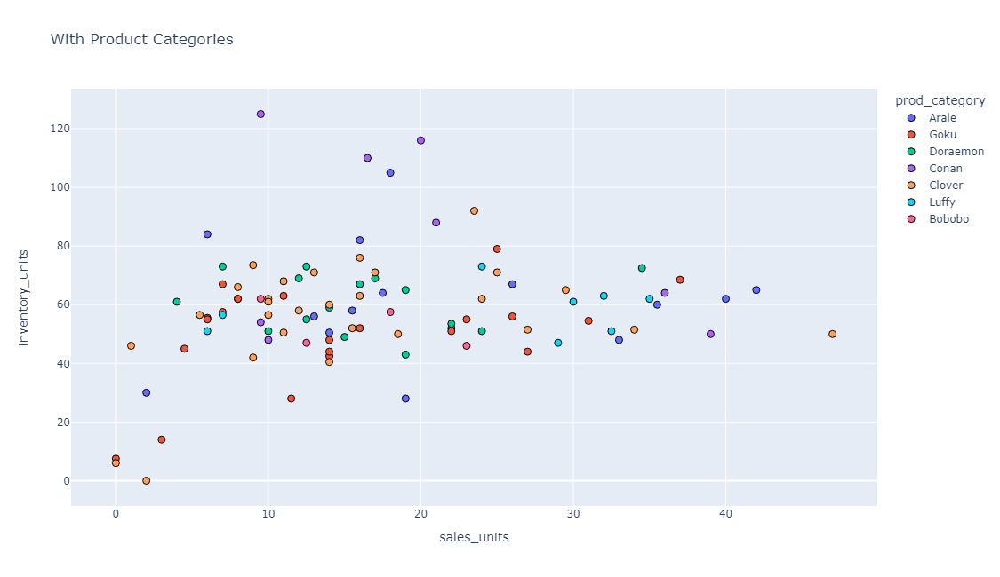

In [48]:
fig = px.scatter(
    sales_inv, 
    x = 'sales_units', 
    y = 'inventory_units',
    color = 'prod_category',
    title = 'With Product Categories'
)

fig.update_layout(
    height = 650,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.update_traces(
    marker = dict(
        size = 8,
        line = dict(
            width = 1,
            color = 'Black'
        )
    ),
    selector=dict(mode='markers')
)

fig.show()

In [49]:
sales_inv_array = sales_inv[['sales_units', 'inventory_units']].values

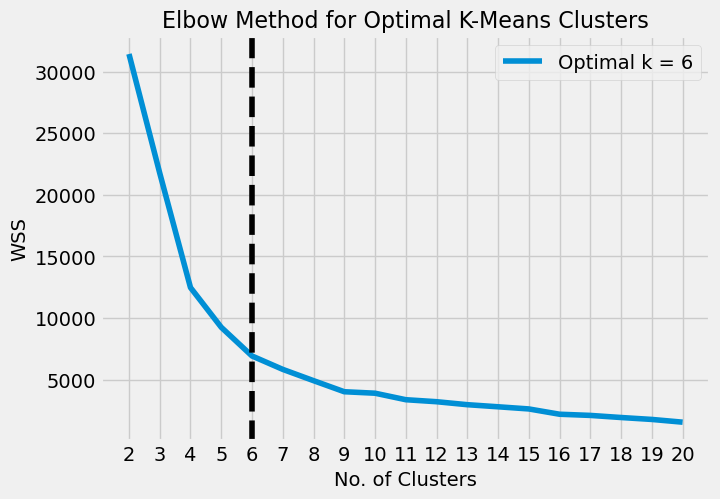

In [50]:
from sklearn.cluster import KMeans
from kneed import KneeLocator

# apply the elbow method to check the 'Within Sum of Squared Distance' and identify the the optimal k clusters to use

wss = []
n = 21

for k in range(2, n):
    kmeans = KMeans(n_clusters = k, random_state = rand_val, n_init = 'auto')
    kmeans.fit(sales_inv_array)
    wss.append(kmeans.inertia_)
    
kl = KneeLocator(range(2, n), wss, curve = 'convex', direction = 'decreasing')
elbow = kl.elbow

plt.figure(figsize = (7, 5))
plt.plot(range(2, n), wss, label = f'Optimal k = {elbow}')
plt.xticks(range(2, n))
plt.axvline(x = elbow, color = 'black', linestyle = '--')
plt.title('Elbow Method for Optimal K-Means Clusters', size = 16)
plt.xlabel("No. of Clusters")
plt.ylabel("WSS")
plt.legend()
plt.show()

In [51]:
# Use the optimal k for applying k-means clustering to the data and have a new column with the assigned clusters

kmeans_model = KMeans(n_clusters = elbow, random_state = rand_val)
sales_inv['cluster'] = kmeans_model.fit_predict(sales_inv_array)

In [52]:
sales_inv.head()

,product_number,prod_category,segment,sales_units,inventory_units,cluster
0,6909,Arale,Premium,2.0,30.0,3
1,7896,Goku,Core,7.0,67.0,0
2,8883,Goku,Core,8.0,62.0,0
3,9870,Doraemon,Gaming,12.5,73.0,1
4,10857,Doraemon,Gaming,10.0,51.0,2


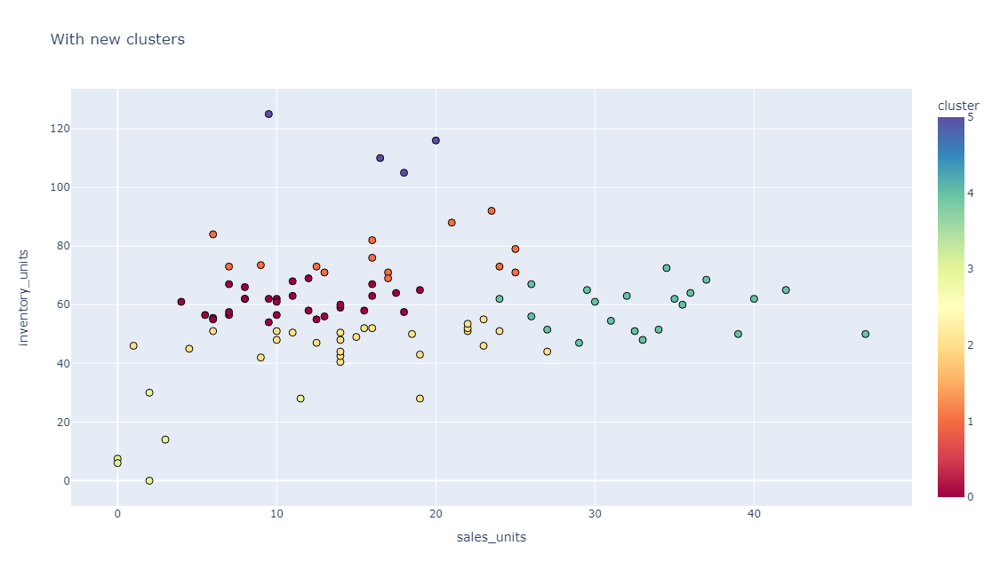

In [53]:
# import plotly.io as pio
# pio.templates.default = "plotly_white"

fig = px.scatter(
    sales_inv, 
    x = 'sales_units', 
    y = 'inventory_units',
    color = 'cluster',
    title = 'With new clusters'
)

fig.update_layout(
    height = 650,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.update_traces(
    marker = dict(
        size = 8,
        line = dict(
            width = 1,
            color = 'Black'
        )
    ),
    selector=dict(mode='markers')
)

fig.show()

In [54]:
df3 = df.merge(
    sales_inv,
    how = 'inner',
    left_on = 'product_number',
    right_on = 'product_number'
)[['date', 'product_number', 'reporterhq_id', 'cluster', 'sales_units_x', 'inventory_units_x']]

df3.rename(columns = {'sales_units_x': 'sales_units', 'inventory_units_x': 'inventory_units'}, inplace = True)

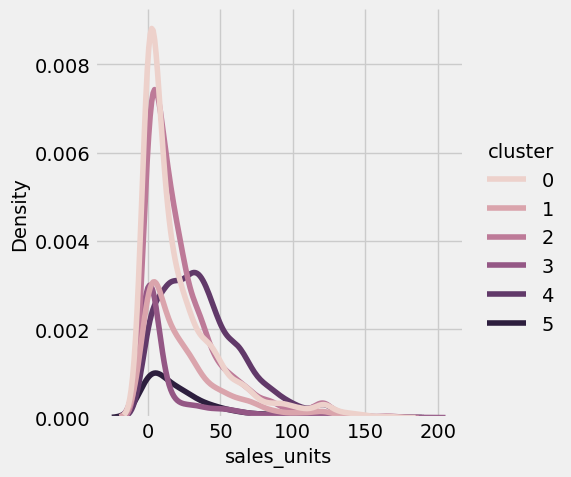

In [55]:
sns.displot(data = df3, x = "sales_units", hue = "cluster", kind = "kde")

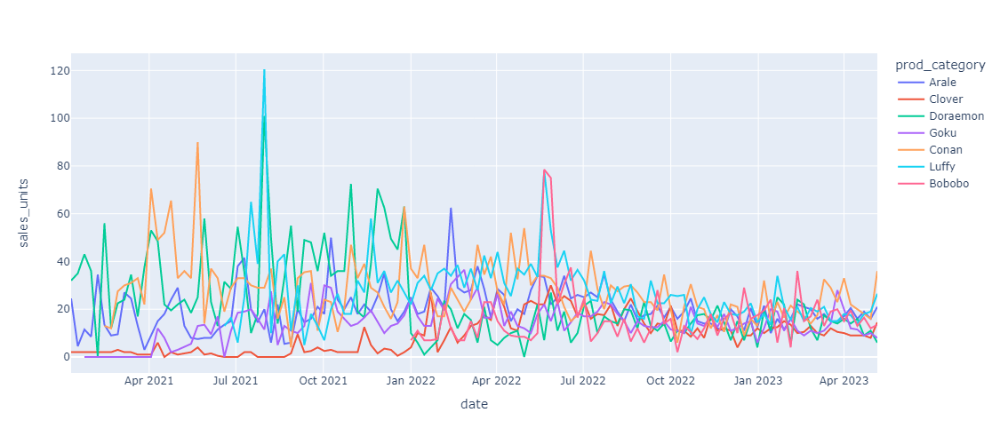

In [56]:
fig = px.line(
    df.groupby(['date', 'prod_category'])['sales_units'].median().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'prod_category',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

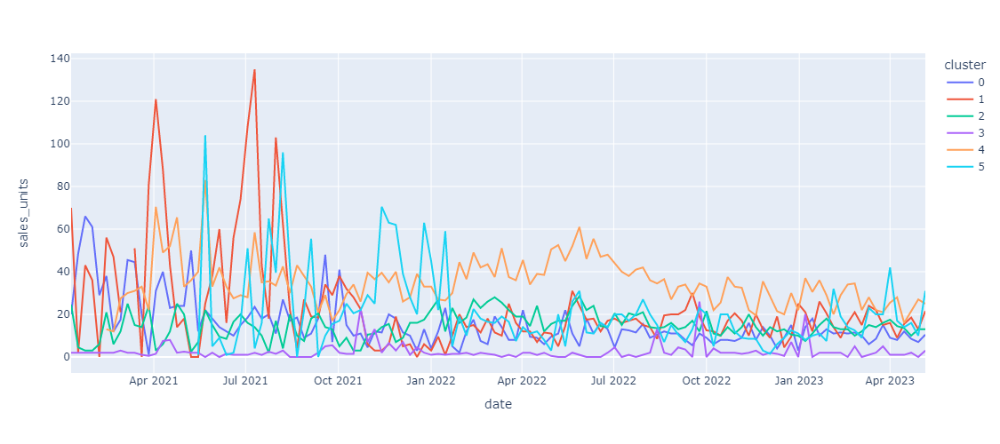

In [57]:
fig = px.line(
    df3.groupby(['date', 'cluster'])['sales_units'].median().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

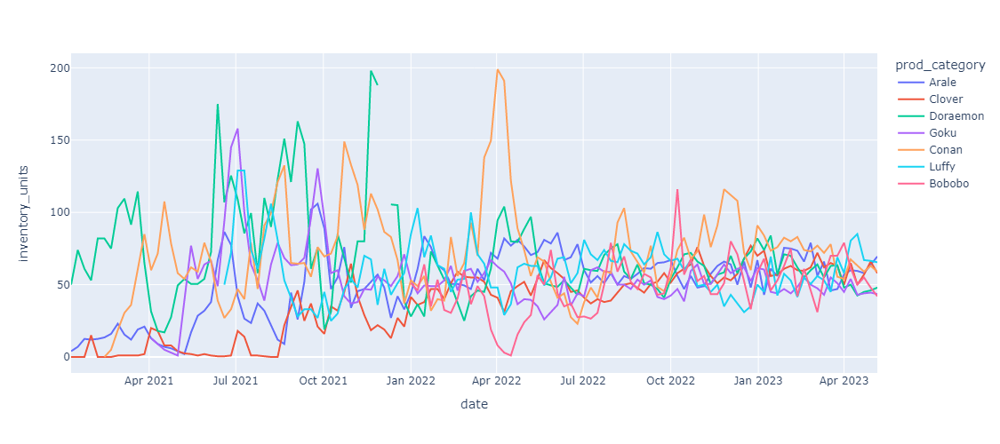

In [58]:
fig = px.line(
    df.groupby(['date', 'prod_category'])['inventory_units'].median().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'prod_category',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

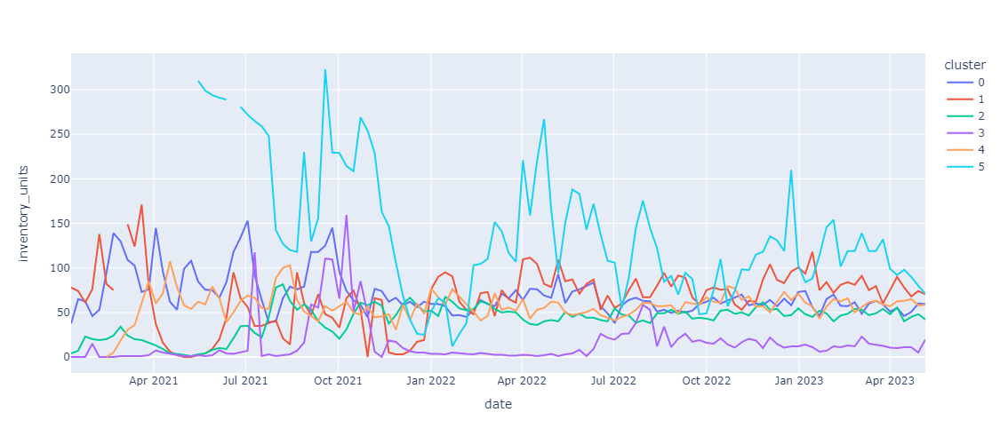

In [59]:
fig = px.line(
    df3.groupby(['date', 'cluster'])['inventory_units'].median().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

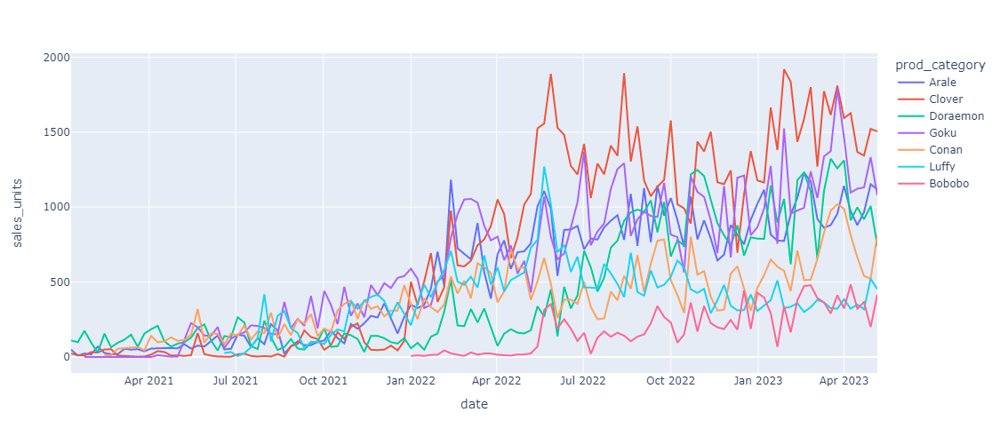

In [60]:
fig = px.line(
    df.groupby(['date', 'prod_category'])['sales_units'].sum().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'prod_category',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

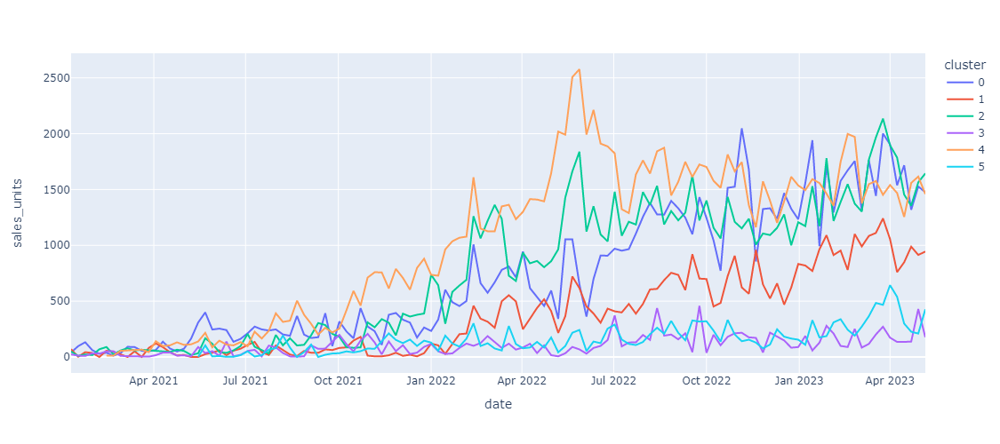

In [61]:
fig = px.line(
    df3.groupby(['date', 'cluster'])['sales_units'].sum().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

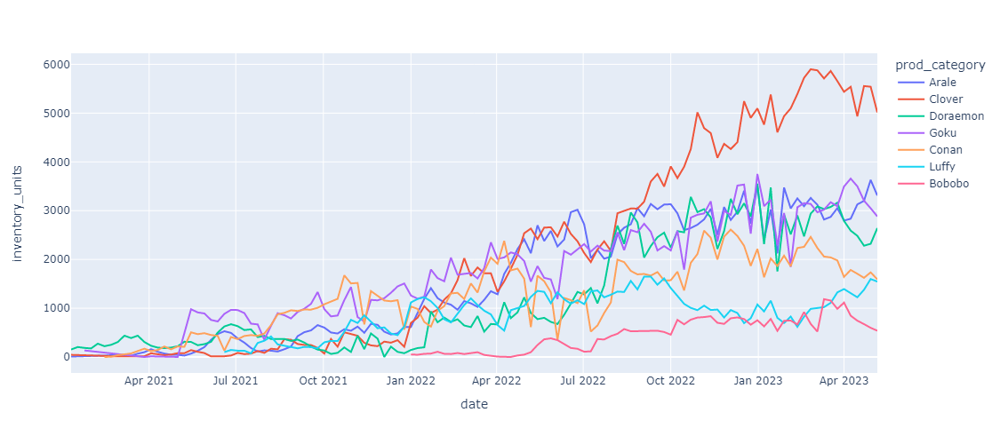

In [62]:
fig = px.line(
    df.groupby(['date', 'prod_category'])['inventory_units'].sum().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'prod_category',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

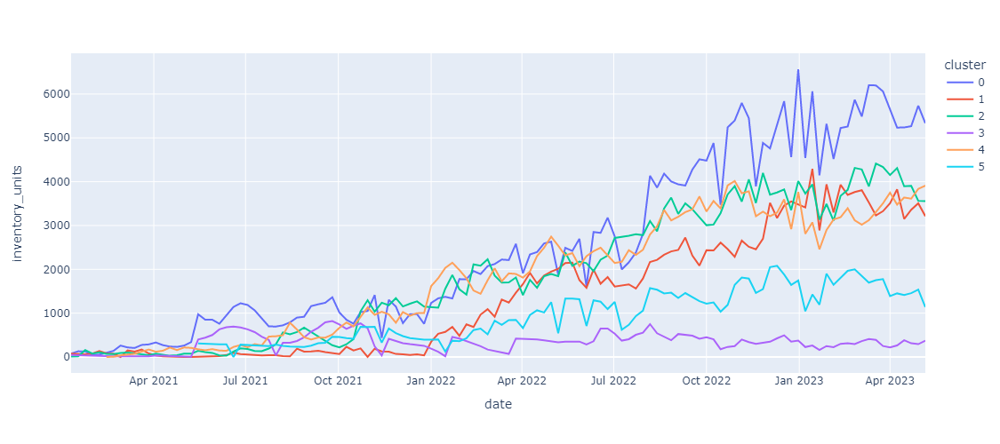

In [63]:
fig = px.line(
    df3.groupby(['date', 'cluster'])['inventory_units'].sum().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

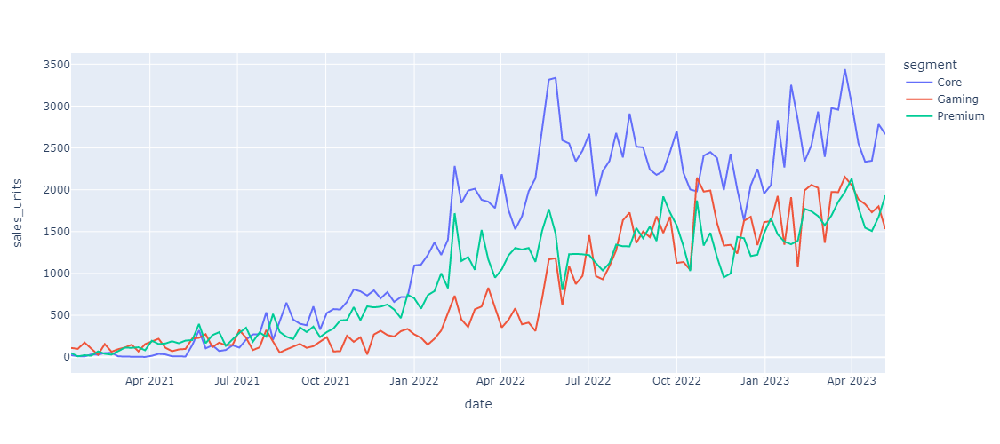

In [64]:
fig = px.line(
    df.groupby(['date', 'segment'])['sales_units'].sum().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'segment',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

In [65]:
sales_inv

,product_number,prod_category,segment,sales_units,inventory_units,cluster
0,6909,Arale,Premium,2.0,30.0,3
1,7896,Goku,Core,7.0,67.0,0
2,8883,Goku,Core,8.0,62.0,0
3,9870,Doraemon,Gaming,12.5,73.0,1
4,10857,Doraemon,Gaming,10.0,51.0,2
...,...,...,...,...,...,...
95,238854,Goku,Core,8.0,62.0,0
96,239841,Goku,Core,7.0,57.5,0
97,240828,Conan,Premium,9.5,125.0,5
98,242802,Conan,Premium,9.5,54.0,0


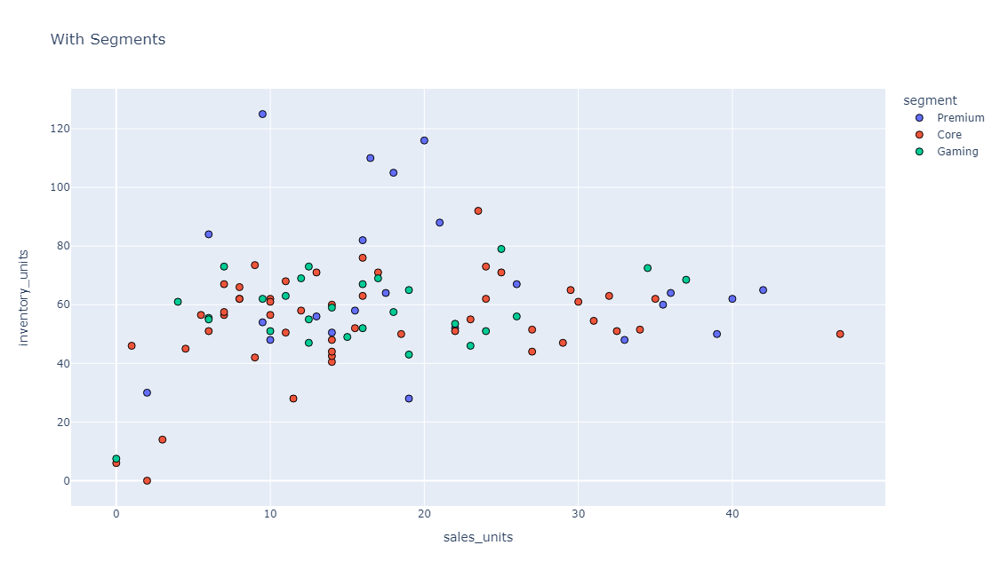

In [66]:
fig = px.scatter(
    sales_inv, 
    x = 'sales_units', 
    y = 'inventory_units',
    color = 'segment',
    title = 'With Segments'
)

fig.update_layout(
    height = 650,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.update_traces(
    marker = dict(
        size = 8,
        line = dict(
            width = 1,
            color = 'Black'
        )
    ),
    selector=dict(mode='markers')
)

fig.show()

<Axes: xlabel='sales_units', ylabel='Density'>

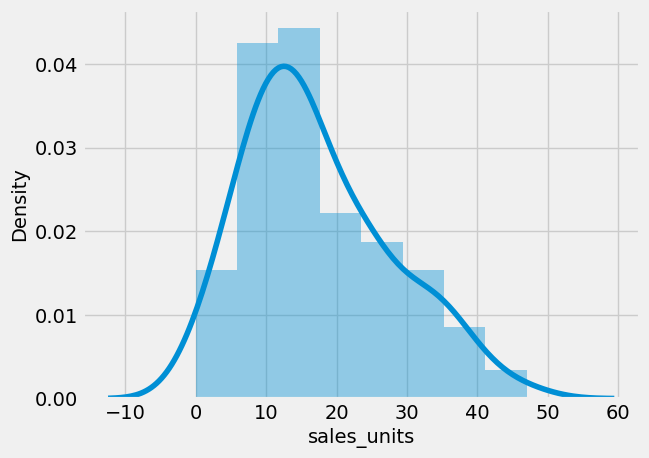

In [67]:
sns.distplot(sales_inv.sales_units)

<Axes: xlabel='inventory_units', ylabel='Density'>

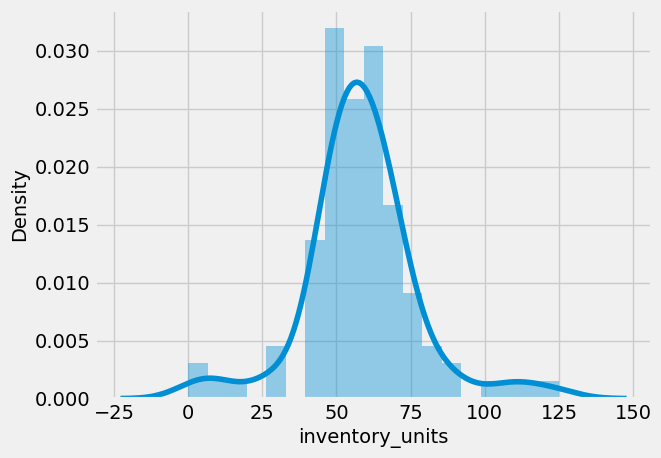

In [68]:
sns.distplot(sales_inv.inventory_units)

In [69]:
def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

In [70]:
from sklearn.mixture import GaussianMixture
from sklearn import metrics

# n_clusters=np.arange(2, 11)
# sils=[]
# sils_err=[]
# iterations=20
# for n in n_clusters:
#     tmp_sil=[]
#     for _ in range(iterations):
#         gmm=GaussianMixture(n, n_init=2).fit(sales_inv_array) 
#         labels=gmm.predict(sales_inv_array)
#         sil=metrics.silhouette_score(sales_inv_array, labels, metric='euclidean')
#         tmp_sil.append(sil)
#     val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
#     err=np.std(tmp_sil)
#     sils.append(val)
#     sils_err.append(err)

In [71]:
# plt.errorbar(n_clusters, sils, yerr=sils_err)
# plt.title("Silhouette Scores", fontsize=20)
# plt.xticks(n_clusters)
# plt.xlabel("N. of clusters")
# plt.ylabel("Score")

In [72]:
gmm = GaussianMixture(n_components = 4).fit(sales_inv_array)
sales_inv['gmm_cluster'] = gmm.predict(sales_inv_array)

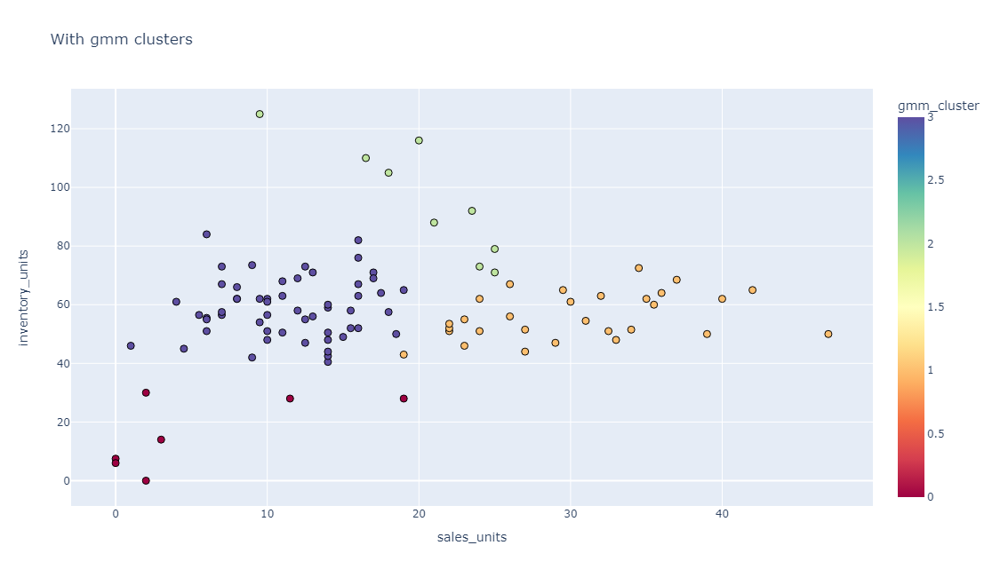

In [73]:
fig = px.scatter(
    sales_inv, 
    x = 'sales_units', 
    y = 'inventory_units',
    color = 'gmm_cluster',
    title = 'With gmm clusters'
)

fig.update_layout(
    height = 650,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.update_traces(
    marker = dict(
        size = 8,
        line = dict(
            width = 1,
            color = 'Black'
        )
    ),
    selector=dict(mode='markers')
)

fig.show()

In [74]:
df4 = df.merge(
    sales_inv,
    how = 'inner',
    left_on = 'product_number',
    right_on = 'product_number'
)[['date', 'product_number', 'reporterhq_id', 'gmm_cluster', 'sales_units_x', 'inventory_units_x']]

df4.rename(columns = {'sales_units_x': 'sales_units', 'inventory_units_x': 'inventory_units'}, inplace = True)

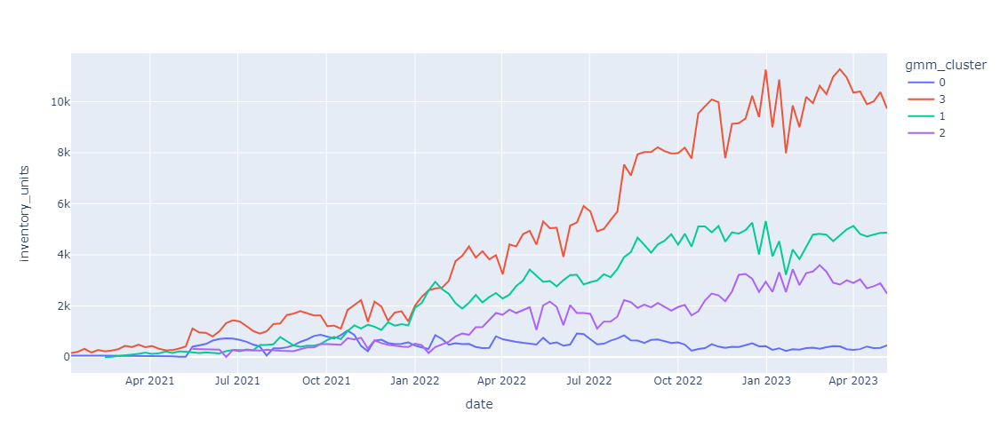

In [75]:
fig = px.line(
    df4.groupby(['date', 'gmm_cluster'])['inventory_units'].sum().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'gmm_cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

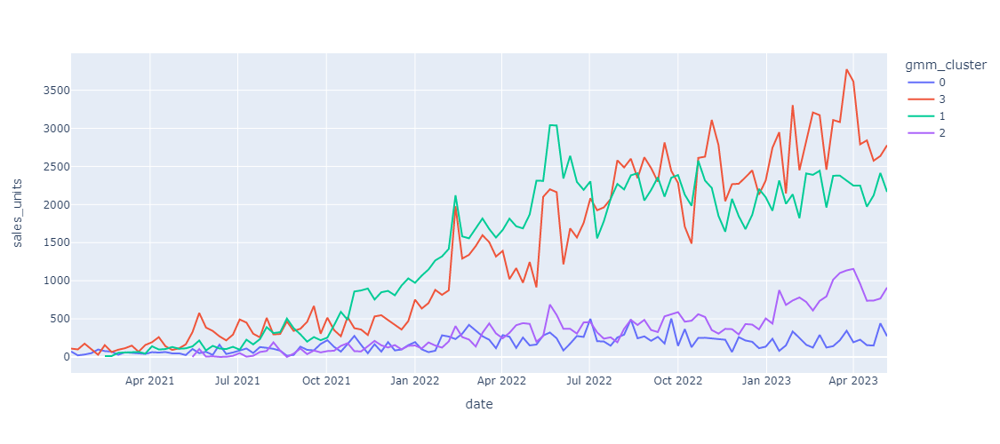

In [76]:
fig = px.line(
    df4.groupby(['date', 'gmm_cluster'])['sales_units'].sum().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'gmm_cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

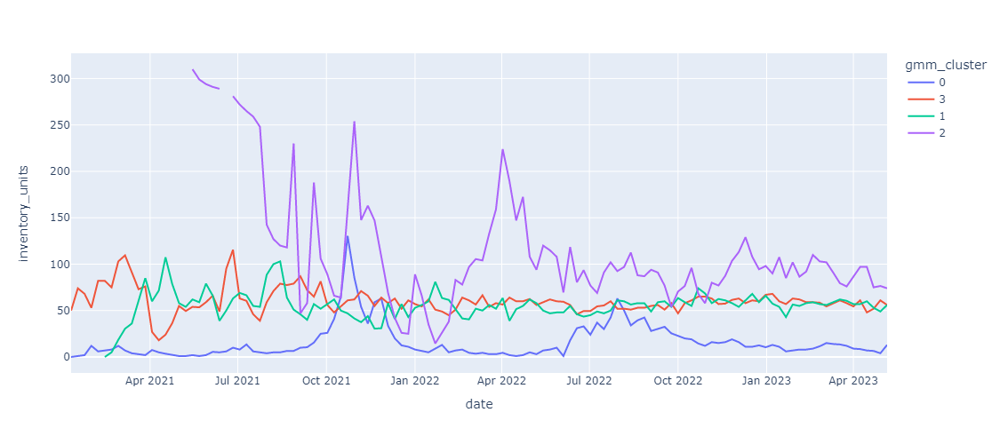

In [77]:
fig = px.line(
    df4.groupby(['date', 'gmm_cluster'])['inventory_units'].median().reset_index(), 
    x = 'date', 
    y = 'inventory_units',
    color = 'gmm_cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

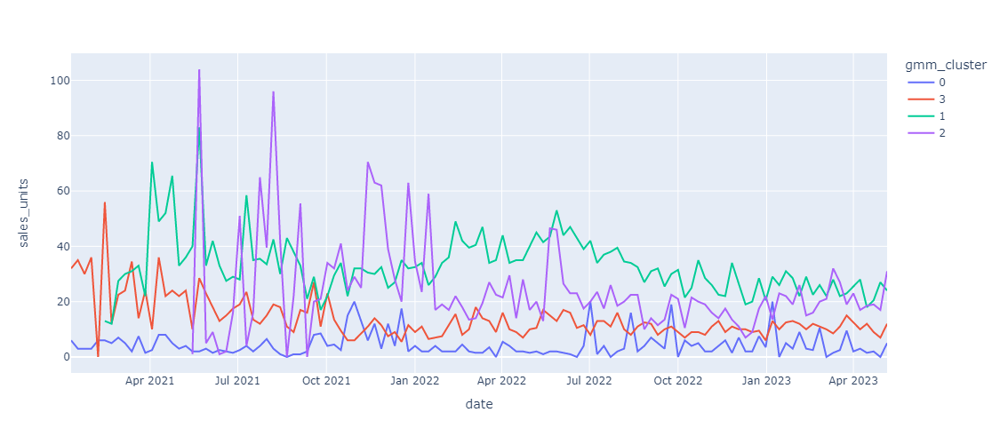

In [78]:
fig = px.line(
    df4.groupby(['date', 'gmm_cluster'])['sales_units'].median().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'gmm_cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

In [79]:
sales_inv

,product_number,prod_category,segment,sales_units,inventory_units,cluster,gmm_cluster
0,6909,Arale,Premium,2.0,30.0,3,0
1,7896,Goku,Core,7.0,67.0,0,3
2,8883,Goku,Core,8.0,62.0,0,3
3,9870,Doraemon,Gaming,12.5,73.0,1,3
4,10857,Doraemon,Gaming,10.0,51.0,2,3
...,...,...,...,...,...,...,...
95,238854,Goku,Core,8.0,62.0,0,3
96,239841,Goku,Core,7.0,57.5,0,3
97,240828,Conan,Premium,9.5,125.0,5,2
98,242802,Conan,Premium,9.5,54.0,0,3


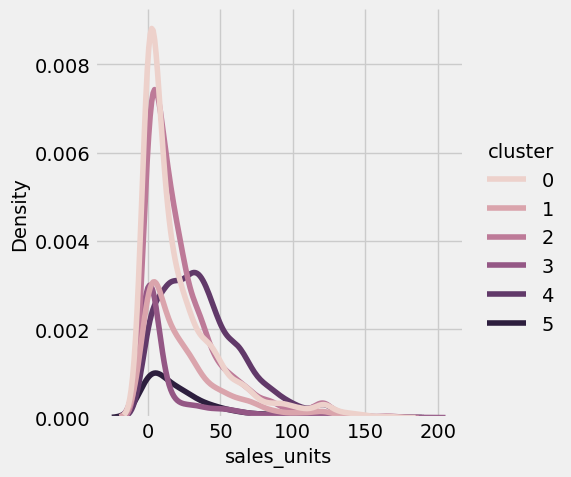

In [80]:
sns.displot(data = df3, x = "sales_units", hue = "cluster", kind = "kde")

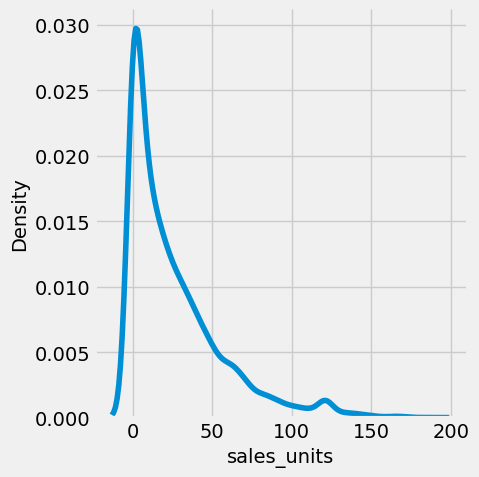

In [81]:
sns.displot(data = df3, x = "sales_units", kind = "kde")

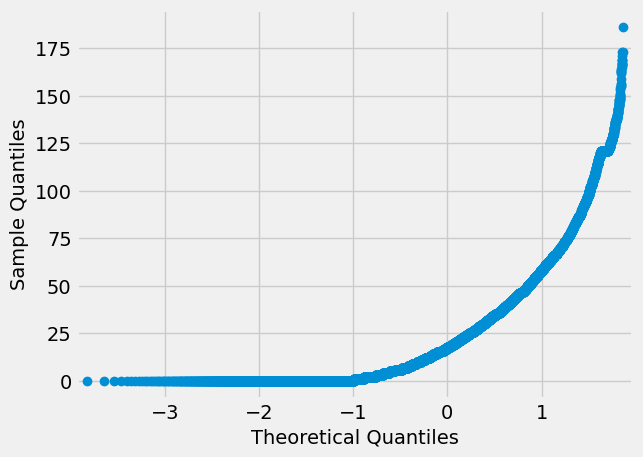

In [82]:
qqplot(df3['sales_units'], line = 's')
plt.show()

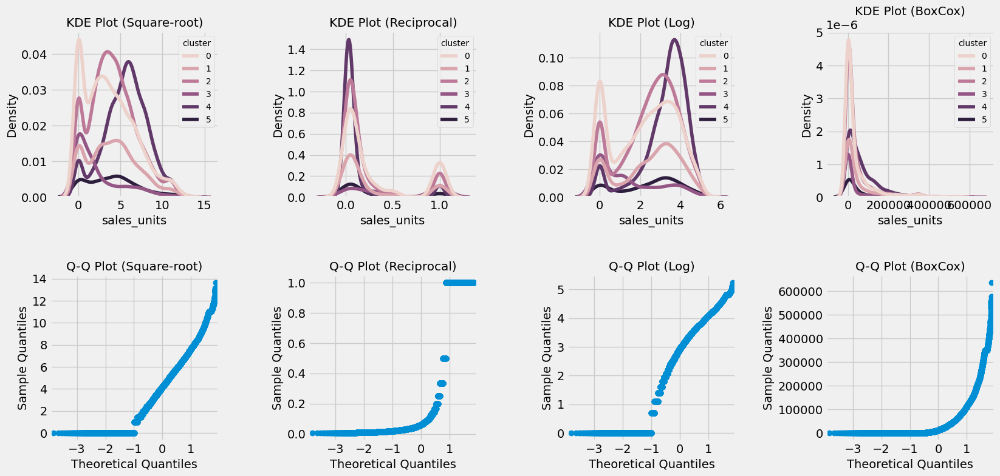

In [83]:
fig, ax = plt.subplots(2, 4, figsize = (18, 9), squeeze = True)
fig.tight_layout(pad = 5)
plt.rcParams['font.size'] = '10'

# square-root transformation
df_transform = df3.copy()
df_transform.sales_units = np.sqrt(df_transform.sales_units)
sns.kdeplot(data = df_transform, x = "sales_units", hue = "cluster", ax = ax[0][0])
ax[0][0].set(title = 'KDE Plot (Square-root)')
qqplot(df_transform['sales_units'], line = 's', ax = ax[1][0])
ax[1][0].set(title = 'Q-Q Plot (Square-root)')

# # reciprocal transformation
df_transform = df3.copy()
df_transform.sales_units = (1 / (np.array(df_transform.sales_units) + 1))
sns.kdeplot(data = df_transform, x = "sales_units", hue = "cluster", ax = ax[0][1])
ax[0][1].set(title = 'KDE Plot (Reciprocal)')
qqplot(df_transform['sales_units'], line = 's', ax = ax[1][1])
ax[1][1].set(title = 'Q-Q Plot (Reciprocal)')

# # log transformation
df_transform = df3.copy()
df_transform.sales_units = np.log(np.array(df_transform.sales_units) + 1)
sns.kdeplot(data = df_transform, x = "sales_units", hue = "cluster", ax = ax[0][2])
ax[0][2].set(title = 'KDE Plot (Log)')
qqplot(df_transform['sales_units'], line = 's', ax = ax[1][2])
ax[1][2].set(title = 'Q-Q Plot (Log)')

# # boxcox transformation
df_transform = df3.copy()
df_transform.sales_units = np.log(np.array(df_transform.sales_units) + 1)
df_transform['sales_units'], bc_lambda = boxcox((df_transform['sales_units'] + 1).values)
sns.kdeplot(data = df_transform, x = "sales_units", hue = "cluster", ax = ax[0][3])
ax[0][3].set(title = 'KDE Plot (BoxCox)')
qqplot(df_transform['sales_units'], line = 's', ax = ax[1][3])
ax[1][3].set(title = 'Q-Q Plot (BoxCox)', )


plt.show()

In [94]:
df_transform = df3.copy()
df_transform.sales_units = np.log(np.array(df_transform.sales_units) + 1)
df_transform.inventory_units = np.log(np.array(df_transform.inventory_units) + 1)
df_transform.rename(columns = {'sales_units': 'log_sales', 'inventory_units': 'log_inventory'}, inplace = True)

In [95]:
df_transform

,date,product_number,reporterhq_id,cluster,log_sales,log_inventory
0,2021-01-09,12831,12,0,2.197225,3.931826
1,2021-01-16,12831,12,0,4.143135,4.543295
2,2021-01-23,12831,12,0,4.753590,4.330733
3,2021-02-27,12831,12,0,2.484907,4.644391
4,2021-03-06,12831,12,0,4.290459,4.094345
...,...,...,...,...,...,...
15171,2023-04-29,107583,6,1,2.639057,3.951244
15172,2023-05-06,107583,87,1,3.258097,3.737670
15173,2023-05-06,107583,27,1,3.555348,4.605170
15174,2023-05-06,107583,15,1,0.000000,3.465736


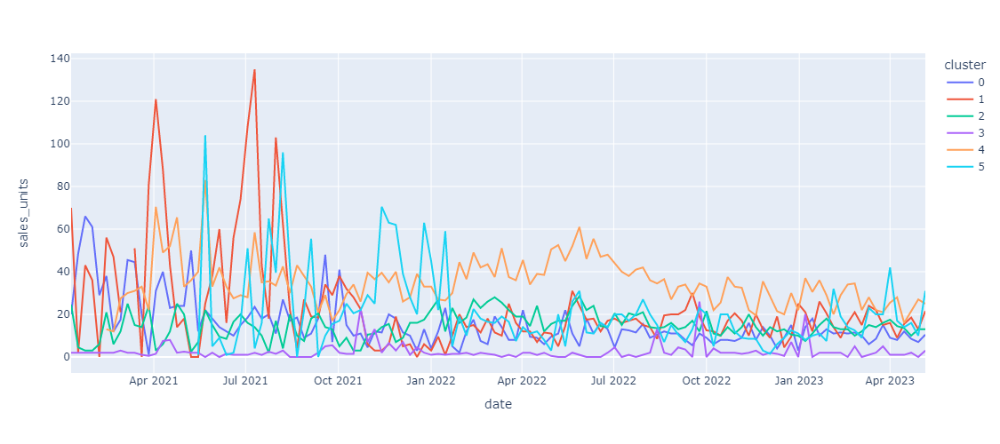

In [96]:
fig = px.line(
    df3.groupby(['date', 'cluster'])['sales_units'].median().reset_index(), 
    x = 'date', 
    y = 'sales_units',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

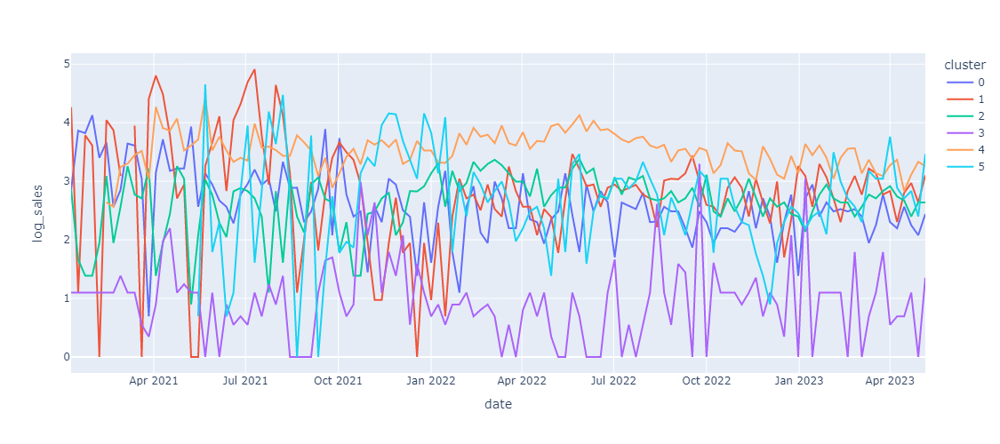

In [99]:
fig = px.line(
    df_transform.groupby(['date', 'cluster'])['log_sales'].median().reset_index(), 
    x = 'date', 
    y = 'log_sales',
    color = 'cluster',
    title = ''
)

fig.update_layout(
    height = 500,
    coloraxis = dict( colorscale = 'Spectral')
)

fig.show()

In [98]:
df_transform

,date,product_number,reporterhq_id,cluster,log_sales,log_inventory
0,2021-01-09,12831,12,0,2.197225,3.931826
1,2021-01-16,12831,12,0,4.143135,4.543295
2,2021-01-23,12831,12,0,4.753590,4.330733
3,2021-02-27,12831,12,0,2.484907,4.644391
4,2021-03-06,12831,12,0,4.290459,4.094345
...,...,...,...,...,...,...
15171,2023-04-29,107583,6,1,2.639057,3.951244
15172,2023-05-06,107583,87,1,3.258097,3.737670
15173,2023-05-06,107583,27,1,3.555348,4.605170
15174,2023-05-06,107583,15,1,0.000000,3.465736


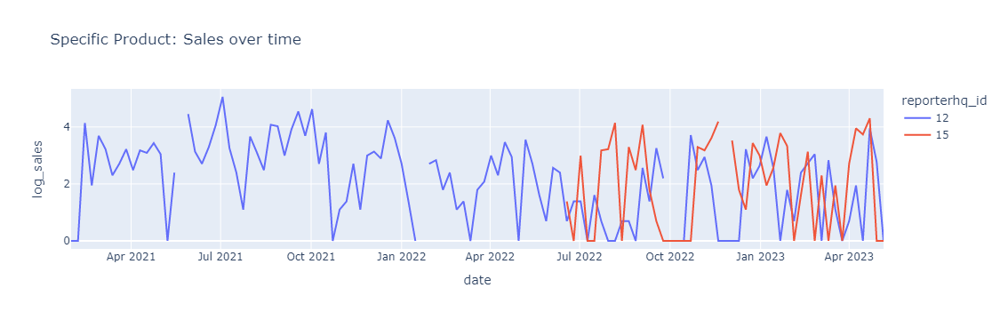

In [100]:
fig = px.line(
    df_transform.loc[df_transform.product_number == 10857], 
    x = 'date', 
    y = 'log_sales',
    color = 'reporterhq_id',
    title = 'Specific Product: Sales over time'
)

fig.show()

In [92]:
df_transform.loc[df_transform.product_number == 10857].head(30)

,date,product_number,reporterhq_id,cluster,sales_units,inventory_units
1278,2021-01-30,10857,12,2,0.000000,53.0
1279,2021-02-06,10857,12,2,0.000000,82.0
1280,2021-02-13,10857,12,2,4.143135,45.0
1281,2021-02-20,10857,12,2,1.945910,35.0
1282,2021-02-27,10857,12,2,3.688879,46.0
1283,2021-03-06,10857,12,2,3.218876,70.0
1284,2021-03-13,10857,12,2,2.302585,59.0
1285,2021-03-20,10857,12,2,2.708050,37.0
1286,2021-03-27,10857,12,2,3.218876,16.0
1287,2021-04-03,10857,12,2,2.484907,7.0
